In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import pandas as pd

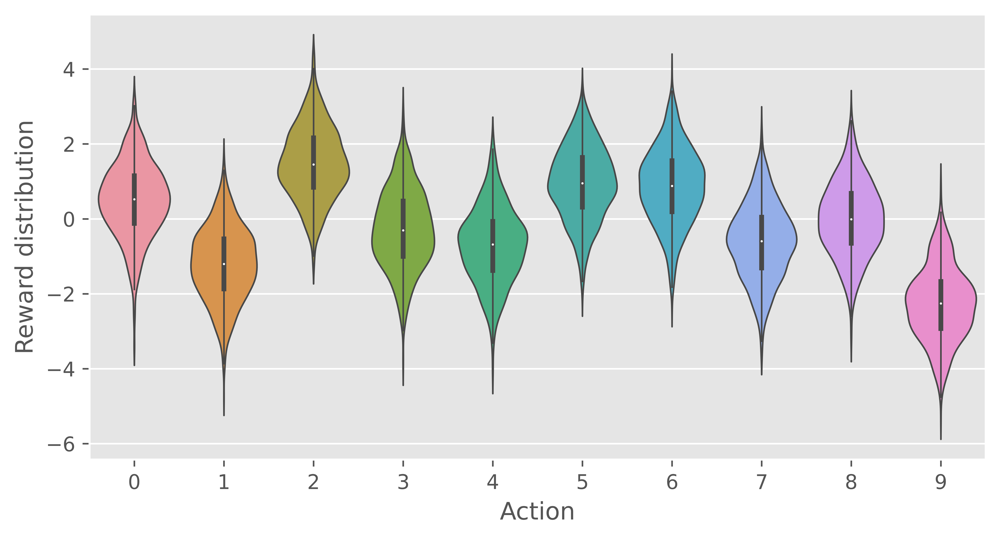

In [11]:
plt.style.use('ggplot')
np.random.seed(1234)
k = 10 # number of arms
q_true = np.random.randn(k)

fig, ax = plt.subplots(1, 1, figsize=(8, 4), dpi=1200)
sns.violinplot(data=np.random.randn(1000, 10) + q_true, linewidth=0.8, ax=ax)
ax.set_xlabel("Action")
ax.set_ylabel("Reward distribution")
plt.show()

In [113]:
class Bandit:
    def __init__(
            self, 
            k: int=10, 
            epsilon: float=0.0, 
            initial: float=0.0, 
            true_reward: float=0.0, 
            step_size: float=0.1, 
            sample_average: bool=False,
            ucb_param: float|None=None,
            gradient: bool=False,
            gradient_baseline: bool=False,
        ):
        self.k = k
        self.actions = np.arange(self.k)
        self.epsilon = epsilon
        self.initial = initial
        self.true_reward = true_reward
        self.step_size = step_size
        self.average_reward = 0.0

        self.sample_average = sample_average
        self.ucb_param = ucb_param
        self.gradient = gradient
        self.gradient_baseline = gradient_baseline

    def reset(self):
        # real reward for each action at time t
        self.q_true = np.random.randn(self.k) + self.true_reward

        # estimation for each action at time t
        self.q_estimation = np.zeros(self.k) + self.initial

        # # of chosen times for each action
        self.action_count = np.zeros(self.k)
        self.best_action = np.argmax(self.q_true)

        self.time = 0

    def act(self):
        if np.random.rand() < self.epsilon:
            return np.random.choice(self.actions)
        
        if self.ucb_param is not None:
            # A_t = arg max_a ( Q_t + c * sqrt(ln(t) / n) )
            ucb_estimation = self.q_estimation + \
                self.ucb_param * np.sqrt(np.log(self.time + 1) / (self.action_count + 1e-5))
            q_best = np.max(ucb_estimation)
            return np.random.choice(np.where(ucb_estimation == q_best)[0])
        
        if self.gradient:
            exp_estimation = np.exp(self.q_estimation)
            self.action_prob = exp_estimation / exp_estimation.sum()
            return np.random.choice(self.actions, p=self.action_prob)

        q_best = np.max(self.q_estimation)
        return np.random.choice(np.where(self.q_estimation == q_best)[0])
    
    def step(self, action):
        # give reward at time t by choosing action
        reward = np.random.randn() + self.q_true[action]
        # update records
        self.time += 1
        self.action_count[action] += 1
        self.average_reward += (reward - self.average_reward) / self.time

        if self.sample_average:
            # update estimation using sample averages
            self.q_estimation[action] += (reward - self.q_estimation[action]) / self.action_count[action]
        elif self.gradient:
            one_hot = np.zeros(self.k)
            one_hot[action] = 1
            if self.gradient_baseline:
                baseline = self.average_reward
            else:
                baseline = 0
            self.q_estimation += self.step_size * (reward - baseline) * (one_hot - self.action_prob)
        else:
            # update estimation with constant step size
            self.q_estimation[action] += self.step_size * (reward - self.q_estimation[action])
        
        return reward
    
def simulate(n_run: int, n_time: int, bandits: list[Bandit]):
    """Simulate multi-armed bandit experiment
    Args:
        n_run (int): number of run, each run means using a k-armed bandit with n_times
        n_time (int): number of time to experience for each bandit
        bandits (list[Bandit]): bandits list, each bandit has different experiment settings
    """
    rewards = np.zeros((len(bandits), n_run, n_time))
    best_action_counts = np.zeros(rewards.shape)
    best_actions = np.zeros((len(bandits), n_run))
    for i, bandit in enumerate(bandits):
        for r in tqdm(range(n_run), total=n_run, desc=f'Simulating Exp-{i}'):
            bandit.reset()  # reset bandit: the same bandit can be used for multiple runs
            best_actions[i, r] = bandit.best_action
            for t in range(n_time):
                action = bandit.act()
                reward = bandit.step(action)
                rewards[i, r, t] = reward
                if action == bandit.best_action:
                    best_action_counts[i, r, t] = 1
                    
    mean_best_action_counts = best_action_counts.mean(axis=1)
    mean_rewards = rewards.mean(axis=1)
    return mean_rewards, mean_best_action_counts, best_actions

In [40]:
# np.random.seed(1234)
k = 10
n_run = 2000
n_time = 1000
epsilons = [0, 0.1, 0.01]
bandits = [Bandit(k=k, epsilon=eps, sample_average=True) for eps in epsilons]
rewards, best_action_counts, best_actions = simulate(n_run, n_time, bandits, rt_raw=True)

Simulating Exp-2: 100%|██████████| 2000/2000 [00:25<00:00, 77.99it/s]


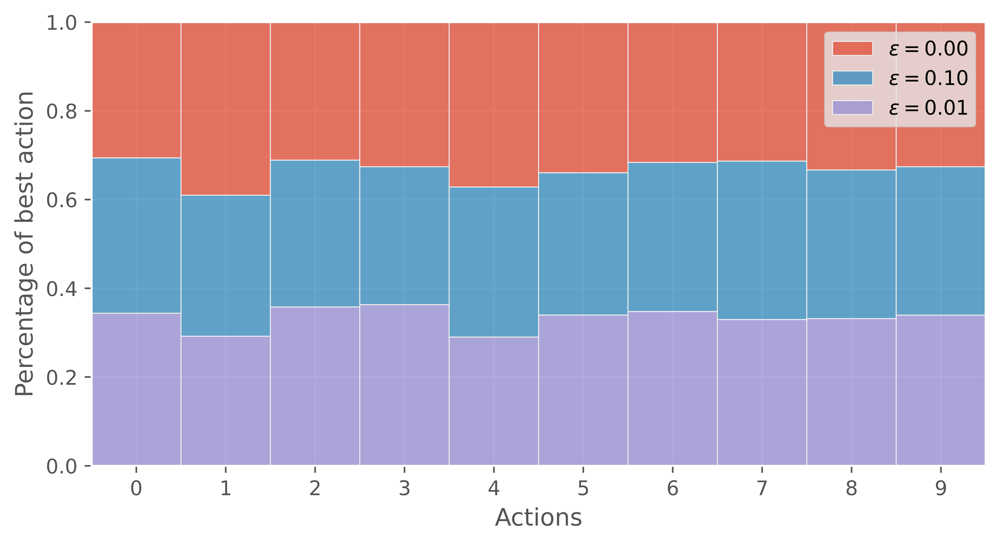

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4), dpi=1200)
sns.histplot(data=pd.DataFrame(best_actions.T, columns=[f'$\epsilon={eps:.2f}$' for eps in epsilons]), 
             bins=10, common_bins=True, discrete=True, multiple='fill', ax=ax)
ax.set_xticks(np.arange(k))
ax.set_xticklabels([f'{i}' for i in range(k)])
ax.set_ylabel('Percentage of best action')
ax.set_xlabel('Actions')
plt.show() 

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4), dpi=1200)
cols = [f'$\epsilon={eps:.2f}$' for eps in epsilons]
ax1, ax2 = axes
sns.lineplot(data=pd.DataFrame(rewards.T, columns=cols), dashes=False, ax=ax1)
sns.lineplot(data=pd.DataFrame(best_action_counts.T, columns=cols), dashes=False, ax=ax2)
ax1.set_xlabel('Steps')
ax1.set_ylabel('Average reward')
ax2.set_xlabel('Steps')
ax2.set_ylabel('Percentage of Optimal action')
ax1.legend()
ax2.legend()
plt.tight_layout()
plt.show()

In [79]:
# np.random.seed(1234)
k = 10
n_run = 2000
n_time = 1000
step_size = 0.1
epsilons = [0, 0.1]
inits = [5, 0]
bandits = [
    Bandit(k=k, epsilon=eps, initial=initial, step_size=step_size, sample_average=True) 
    for (eps, initial) in zip(epsilons, inits)
]
rewards, best_action_counts, best_actions = simulate(n_run, n_time, bandits)

Simulating Exp-1: 100%|██████████| 2000/2000 [00:22<00:00, 87.33it/s]


In [81]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4), dpi=1200)
cols = [f'$\epsilon={eps:.2f}, q_0={initial}$' for (eps, initial) in zip(epsilons, inits)]
ax1, ax2 = axes
sns.lineplot(data=pd.DataFrame(rewards.T, columns=cols), dashes=False, ax=ax1)
sns.lineplot(data=pd.DataFrame(best_action_counts.T, columns=cols), dashes=False, ax=ax2)
ax1.set_xlabel('Steps')
ax1.set_ylabel('Average reward')
ax2.set_xlabel('Steps')
ax2.set_ylabel('Percentage of Optimal action')
ax1.legend()
ax2.legend()
plt.tight_layout()
plt.show()

In [82]:
# np.random.seed(1234)
k = 10
n_run = 2000
n_time = 1000
epsilons = [0, 0.1]
ucb_params = [2.0, None]

bandits = [
    Bandit(k=k, epsilon=eps, ucb_param=ucb_param, sample_average=True) 
    for (eps, ucb_param) in zip(epsilons, ucb_params)
]
rewards, best_action_counts, best_actions = simulate(n_run, n_time, bandits)

Simulating Exp-1: 100%|██████████| 2000/2000 [00:23<00:00, 84.50it/s]


In [83]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4), dpi=1200)
cols = [f'$\epsilon={eps:.2f}, ucb={ucb_param}$' for (eps, ucb_param) in zip(epsilons, ucb_params)]
ax1, ax2 = axes
sns.lineplot(data=pd.DataFrame(rewards.T, columns=cols), dashes=False, ax=ax1)
sns.lineplot(data=pd.DataFrame(best_action_counts.T, columns=cols), dashes=False, ax=ax2)
ax1.set_xlabel('Steps')
ax1.set_ylabel('Average reward')
ax2.set_xlabel('Steps')
ax2.set_ylabel('Percentage of Optimal action')
ax1.legend()
ax2.legend()
plt.tight_layout()
plt.show()

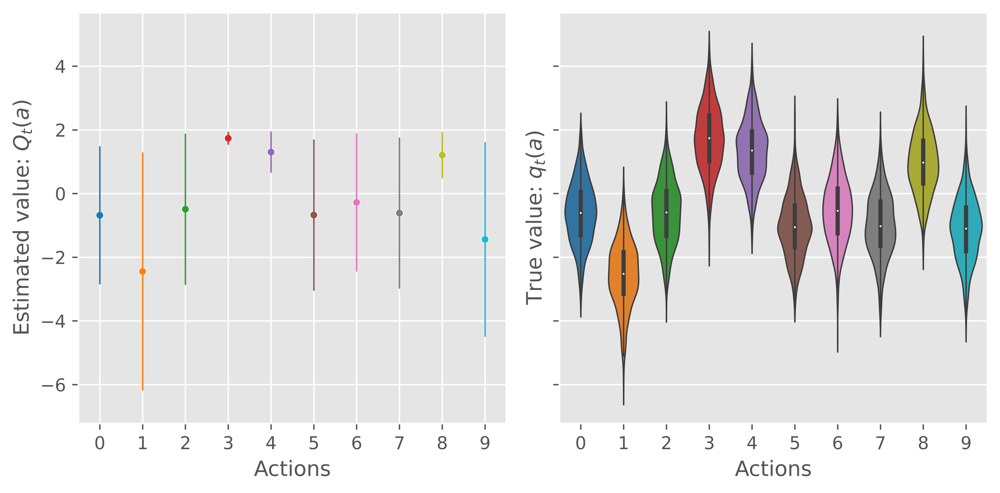

In [110]:
m = bandits[0]
addition = m.ucb_param * np.sqrt(np.log(m.time + 1) / (m.action_count + 1e-5))
palette = sns.color_palette('tab10', n_colors=m.k)
df = pd.DataFrame(
    {
        'actions': m.actions, 
        'q_est': m.q_estimation, 
        'upper': m.q_estimation + addition, 
        'lower': m.q_estimation - addition
    }
)
fig, axes = plt.subplots(1, 2, figsize=(8, 4), dpi=1200, sharey=True, sharex=True)
ax1, ax2 = axes
sns.scatterplot(x='actions', y='q_est', hue='actions', palette=palette, data=df, ax=ax1, size=20, legend=False)
for i in range(m.k):
    ax1.plot([i, i], [df['lower'].values[i], df['upper'].values[i]], linewidth=0.8, color=palette[i])
# sns.lineplot(x='lower', y='upper', hue='actions', palette=palette, data=df, ax=ax1, legend=False)
sns.violinplot(data=np.random.randn(1000, 10) + m.q_true, palette=palette, linewidth=0.8, ax=ax2, legend=False)
ax1.set_ylabel('Estimated value: $Q_t(a)$')
ax2.set_ylabel('True value: $q_t(a)$')
ax1.set_xlabel('Actions')
ax2.set_xlabel('Actions')
plt.tight_layout()
plt.show()

In [116]:
# np.random.seed(1234)
k = 10
n_run = 2000
n_time = 1000
step_sizes = [0.1, 0.1, 0.4, 0.4]
gradient_baselines = [True, False, True, False]
bandits = [
    Bandit(k=k, gradient=True, step_size=step_size, gradient_baseline=gradient_baseline, true_reward=4) 
    for (step_size, gradient_baseline) in zip(step_sizes, gradient_baselines)
]
rewards, best_action_counts, best_actions = simulate(n_run, n_time, bandits)

Simulating Exp-3: 100%|██████████| 2000/2000 [00:29<00:00, 67.81it/s]


In [117]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4), dpi=1200)
cols = [f'$\\alpha={step_size:.2f}, baseline={gradient_baseline}$' 
        for (step_size, gradient_baseline) in zip(step_sizes, gradient_baselines)]
ax1, ax2 = axes
sns.lineplot(data=pd.DataFrame(rewards.T, columns=cols), dashes=False, ax=ax1)
sns.lineplot(data=pd.DataFrame(best_action_counts.T, columns=cols), dashes=False, ax=ax2)
ax1.set_xlabel('Steps')
ax1.set_ylabel('Average reward')
ax2.set_xlabel('Steps')
ax2.set_ylabel('Percentage of Optimal action')
ax1.legend()
ax2.legend()
plt.tight_layout()
plt.show()